In [2]:
import glob
import random
import base64
import pandas as pd

from PIL import Image
from io import BytesIO
from IPython.display import HTML, display
import os
import glob

from compressor import Compressor

pd.set_option('display.max_colwidth', -1)  
from dataloaders import cached_listdir_imgs

%matplotlib inline

WRAN: using Agg backend linux


In [3]:
# CIN_BIN_MIN = 0.5        
# CIN_BIN_MAX = 3.5

# def get_cin_classes(bpsps):
#     """ bpps: (N,) tensor"""
#     return int(_quantize(torch.tensor(bpsps), CIN_BIN_MIN, CIN_BIN_MAX, 20))

# def _quantize(x, bound_low, bound_high, num_bins):
#     bound_range = bound_high - bound_low
#     return x.clamp(bound_low, bound_high).sub(bound_low).div(bound_range).mul(num_bins-1).round().long()

# bins = np.linspace(CIN_BIN_MIN, CIN_BIN_MAX, 20)
# W = bins[2] - bins[1]
# print(get_cin_classes(bins[11] - W/2-0.1))
# print('BPP', (bins[11] - W/2) * 3)

# # top_10 = bpsps_12[-len(bpsps_12)//10:]
# all_bins = collections.Counter(map(get_cin_classes, (bpsp for _, bpsp in bpsps_12)))
# print(all_bins)
# print(sum(all_bins[b] for b in range(11, 19))/len(bpsps_12))

# # p_out = '/scratch/mentzerf/tmp/lowest_bpp_training'
# # os.makedirs(p_out, exist_ok=True)

# # for p, bpp in bpps[:50]:
# #     print(p, bpp)
# #     shutil.copy(p, p_out)
    

In [4]:
import subprocess
envs = subprocess.check_output('bash -c "source ~/.shared_rc; env"', shell=True).decode()
for l in envs.split('\n'):
    if l.count('=') == 1:
        key, value = l.strip().split('=')
        if key in os.environ or key.startswith('_'):
            continue
        print('Setting', key)
        os.environ[key] = value

Setting MKL_THREADING_LAYER


In [15]:
EXT = '.png'

# TEST_SETS = {'Q12': }

# TEST_SET = 'Q12'

# python gather_tests.py $LOG_SBEE  BLA,BLI,BLUPP    $T_OI_BLA_BLI 
# saves into latest_gather.txt
#
# ${LOGS_BEE}_test_csv/$(basename $T_OI_BLA_BLI)
# 
# in there, there are some .csvs, with image,bpsp, named log_date.itr.csv
# as well as image_root_dir.txt, which simply contains $T_OI_BLA_BLI
#
# we can sort the methods by smallest mean diff to flif OR maybe just cols
# flif   logdate1 logdate1_flif logdate2 logdate2_flif etc.
# can we plot all diffs? sure

CSV_BASE_DIR = '/scratch_net/fryr_third/mentzerf/logs/jointlogs_test_csv/'

flag = os.environ['T_VAL_OIR_500_Q12']
# flag = '/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4;/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4_bpg_q14'
BASE_DIR, COMPRESSED_BASE_DIR = flag.split(';')
raw_dataset_name = os.path.basename(BASE_DIR.rstrip('/'))  # e.g.  test_new_clean
compressed_dataset_name = os.path.basename(COMPRESSED_BASE_DIR.rstrip('/'))  # e.g. test_new_clean_bpg_q12

CSV_DIR_CLASSICAL = os.path.join(CSV_BASE_DIR, raw_dataset_name)

CSV_DIR = os.path.join(CSV_BASE_DIR, compressed_dataset_name)

In [16]:
import torch
import IPython
import numpy as np

def normalize_to_0_1(t, mi=None, ma=None):
    if mi is None:
        mi = t.min()
    if ma is None:
        ma = t.max()
    return t.add(-mi).div(ma - mi + 1e-5)

def show_tensor(t, normalize=False, mi=None, ma=None, blow_up=None, show_range=False):
    if show_range:
        r = t.min().item(), t.max().item()
    if normalize:
        t = normalize_to_0_1(t.detach(), mi, ma).mul(255.).round().to(torch.uint8)
        
    t = t.detach().numpy()
    if len(t.shape) == 4:
        t = t[0, ...]
    t_shape = t.shape
    if len(t.shape) == 2:
        t = np.stack([t, t, t], -1)
    if len(t_shape) == 3 and t_shape[0] == 3:
        t = t.transpose(1, 2, 0)

    # now is HWC
    
    
    if blow_up:
        t = t.repeat(blow_up, axis=0).repeat(blow_up, axis=1)
    
    if show_range:
        print(r)
        
    IPython.display.display(Image.fromarray(t))
    
    return t


# from dataloaders.compressed_images_loader import get_residual_dataset

# ds = get_residual_dataset(os.environ['T_NUCLEI_CROP_Q15'], random_transforms=False,
#                           random_scale=False, crop_size=128, mode='both',
#                           discard_shitty=False, sort=True)


# raw, compressed = ds[2]['raw'], ds[2]['compressed']

# for c in range(3):
#     show_tensor(raw[c, ...])
#     show_tensor(compressed[c, ...])
#     show_tensor(raw[c, ...].float() - compressed[c, ...].float(), normalize=True, show_range=True, blow_up=10)

In [17]:
# CSV_DIR = os.path.join(CSV_BASE_DIR, 'val_oi_first30_bpg_q12')
# BASE_DIR, COMPRESSED_BASE_DIR = os.environ['T_OI_VAL30_PNG_Q12'].split(';')

# _D = '/scratch_net/fryr/mentzerf/datasets/openimages_new/val_oi_first30;/scratch_net/fryr_second/mentzerf/datasets/openimages_new/val_oi_first30_bpg_q12/'
# BASE_DIR, COMPRESSED_BASE_DIR = _D.split(';')


BPG_BPSPS = {Compressor.filename_without_bpp(p): Compressor.bpp_from_compressed_file(p) / 3
             for p in cached_listdir_imgs.cached_listdir_imgs(COMPRESSED_BASE_DIR,
                                                             discard_shitty=False).ps}
# print(sorted(BPG_BPSPS.items()))
SKIP = {'1010_0845'}

csv_files_classical = sorted(glob.glob(os.path.join(CSV_DIR_CLASSICAL, '*.csv')))
csv_files_ours = sorted(glob.glob(os.path.join(CSV_DIR, '*.csv')))
csv_files_ours = [c for c in csv_files_ours if not any(skip in c for skip in SKIP)]

first_csv = csv_files_ours[0]

print(csv_files_ours)
print(csv_files_classical)
# del csv_files_ours[0]

Getting lock for /home/mentzerf/net_scratch/datasets/openimages_rand/val_oi_500_r_bpg_q12/cached_glob.pkl: .cached_glob.lock [reset: False]...
>>> filter [min_size=None; discard_s=False]: 0.09692
['/scratch_net/fryr_third/mentzerf/logs/jointlogs_test_csv/val_oi_500_r_bpg_q12/1101_1744.611500.csv']
['/scratch_net/fryr_third/mentzerf/logs/jointlogs_test_csv/val_oi_500_r/flif.csv']


In [18]:
def get_thumbnail(path, cache={}):
    if path in cache:
        return cache[path]
    print('\rCaching', path, end='', flush=True)
    i = Image.open(path)
    i.thumbnail((150, 150), Image.LANCZOS)
    cache[path] = i
    return i

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()

def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

def html(df, head=True):
    if head:
        df = df.head()
    return HTML(df.to_html(formatters={'image': image_formatter}, escape=False))

In [19]:
val = pd.read_csv(first_csv, dtype={'image': str}).sort_values('image')
val_images = list(val['image'])

val['bpg_bpsp'] = val.image.map(lambda fn: BPG_BPSPS[fn])

# val['ratio_bpg_total'] = val[['bpsp', 'bpg_bpsp']].apply(lambda val_row: val_row.bpg_bpsp/val_row.bpsp, axis=1)
# val['res_bpsp'] = val[['bpsp', 'bpg_bpsp']].apply(lambda val_row: val_row.bpsp - val_row.bpg_bpsp, axis=1)

val['file'] = val.image.map(lambda fn: os.path.join(BASE_DIR, fn + EXT))
val['image'] = val.file.map(lambda f: get_thumbnail(f))

# print(val.ratio_bpg_total.mean())

# print(val)

Caching /home/mentzerf/net_scratch/datasets/openimages_rand/val_oi_500_r/ffff21932da3ed01.png

500
1101_1744.611500: Better then flif on 285 images!


,0
flif,2.866778
1101_1744.611500,2.872129


500


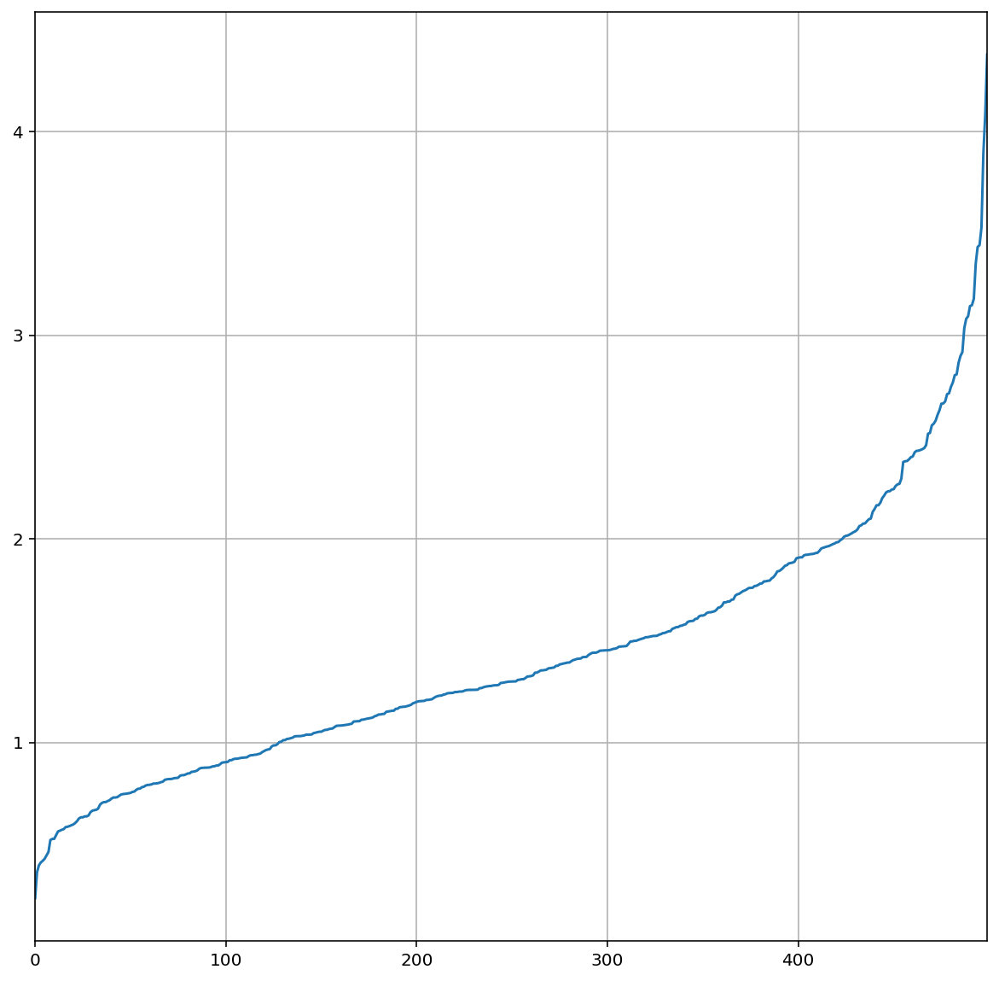

In [23]:
display_keys = ['image', 'bpg_bpsp']

classical = []

get_name = lambda p_: os.path.splitext(os.path.basename(csv_file))[0]

means = {}

for csv_file in csv_files_classical:
    name = get_name(csv_file)
    df = pd.read_csv(csv_file, dtype={'image': str}).sort_values('image')
    if list(df['image']) != val_images:
        print('*** WARN: probably not encoded for this DS', df['image'], val_images)
        break
#     print( list(df['image']) , val_images )
    classical.append(name)
    val[name] = df.bpsp
    display_keys += [name]
    means[name] = df.bpsp.mean()
#     print(name, '\t', df.bpsp.mean())

for csv_file in csv_files_ours:
    name = get_name(csv_file)  # contains image, bpsp columns
    df = pd.read_csv(csv_file, dtype={'image': str}).sort_values('image')
    print(len(df))
    val[name] = df.bpsp
    display_keys += [name]
    
    for classical_name in classical:
        gap_name = f'{name}_{classical_name}_gap'
        val[gap_name] = df.bpsp - val[classical_name]
        
        num_better = sum(1 for v in val[gap_name] if v < 0)
        print(f'{name}: Better then {classical_name} on {num_better} images!')
        
#         display_keys.append(gap_name)
    means[name] = df.bpsp.mean()
#         print(gap_name, '\t', val[gap_name].mean())
#     val[name + '_gap'] = df.bpsp - val.bpsp

%config InlineBackend.figure_format ='retina'

display(pd.DataFrame.from_dict(means, orient='index'))

print(len(val))
# 
val_plot = val.sort_values('bpg_bpsp').reset_index(drop=True)[display_keys]
display(val_plot['bpg_bpsp'].plot(figsize=(10,10), grid=True) )


In [11]:
# f = (val_plot['ratio_bpg_total'] * 100).plot(figsize=(10,5), grid=True)
# f.set_ylim(0, 100)

sort by 1105_2000.101010


,image,file,flif,webp,1105_2000.101010
268,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0868_0.png,0.421933,0.568238,0.507300
169,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0843_1.png,0.555849,0.602772,0.565653
270,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0868_2.png,0.475173,0.604384,0.608174
171,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0843_3.png,0.679534,0.708458,0.695195
52,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0814_0.png,0.662942,0.821092,0.699876

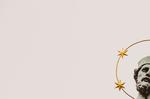
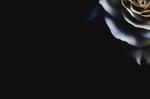
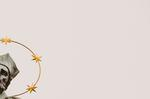
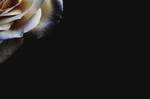
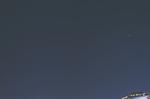

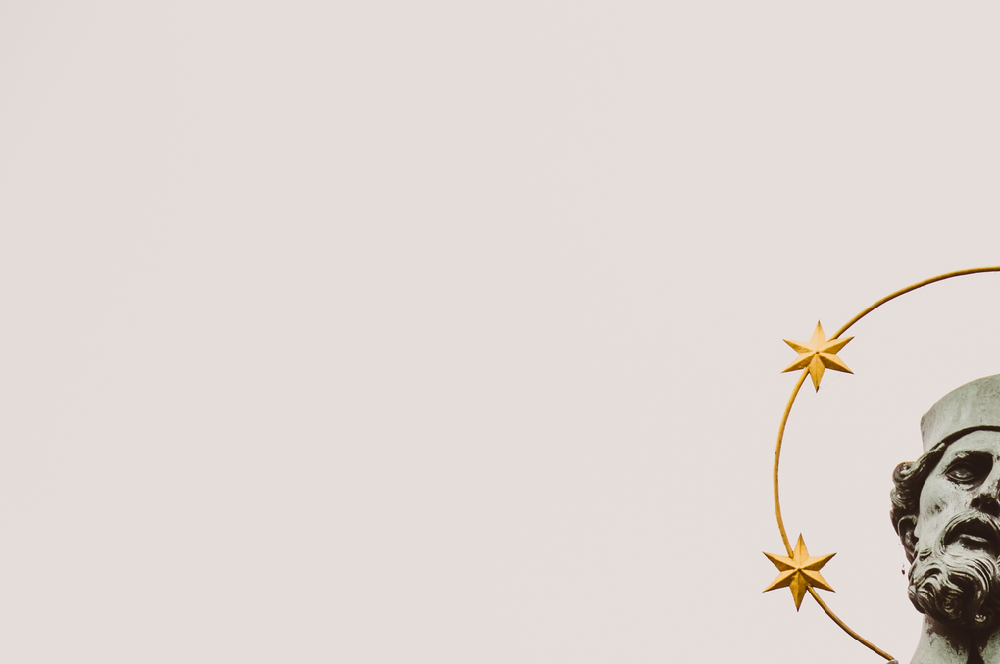

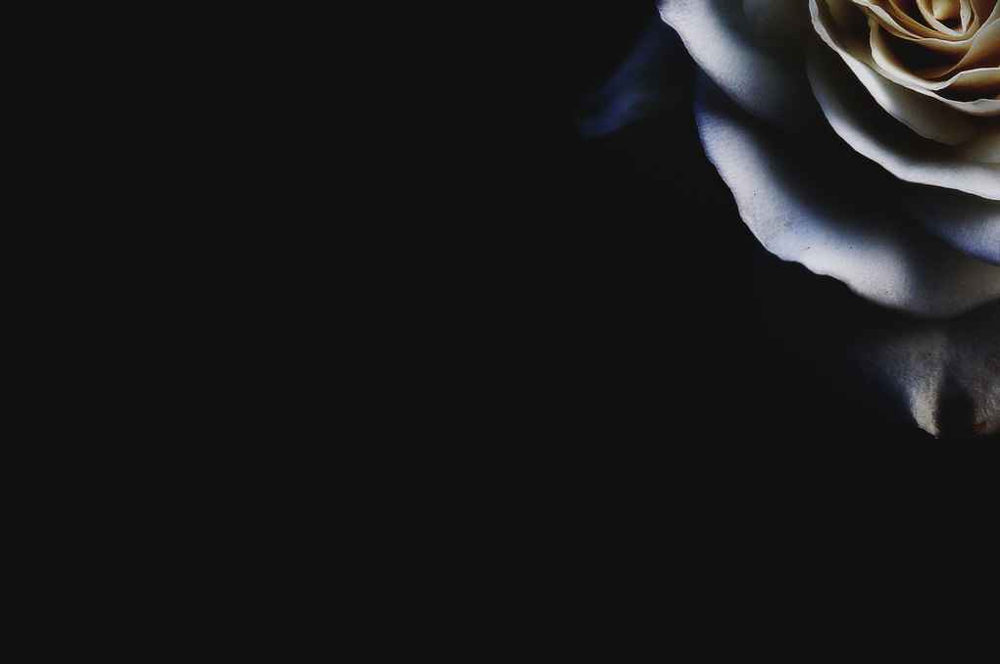

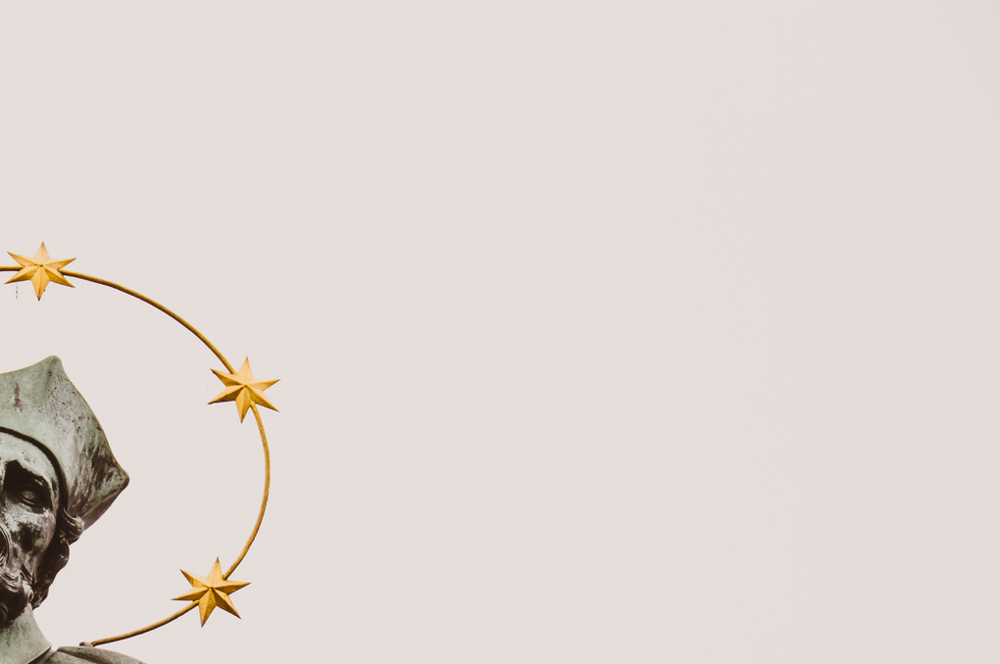

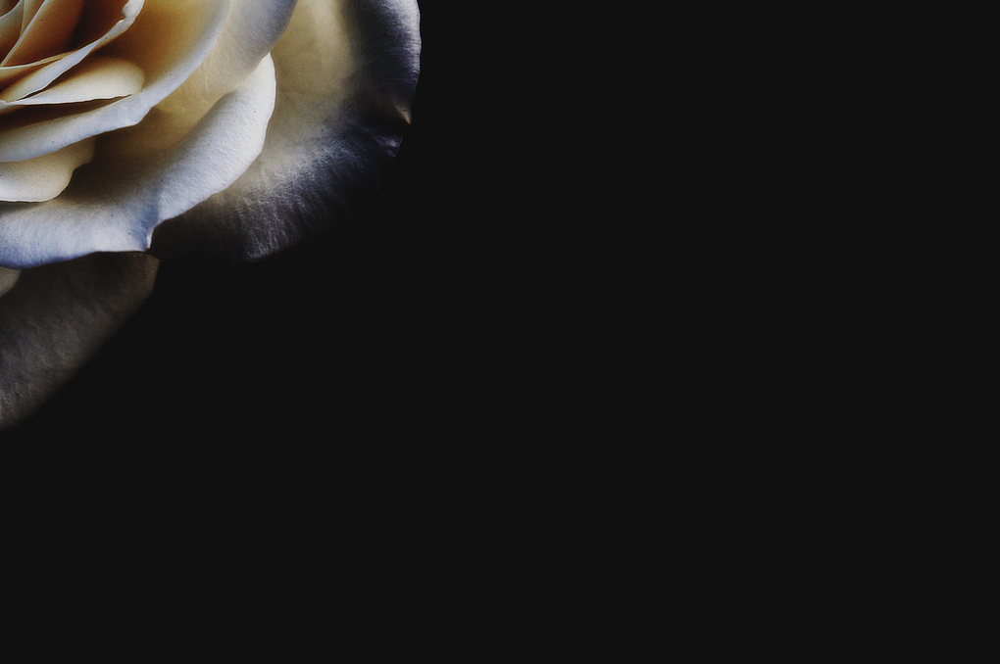

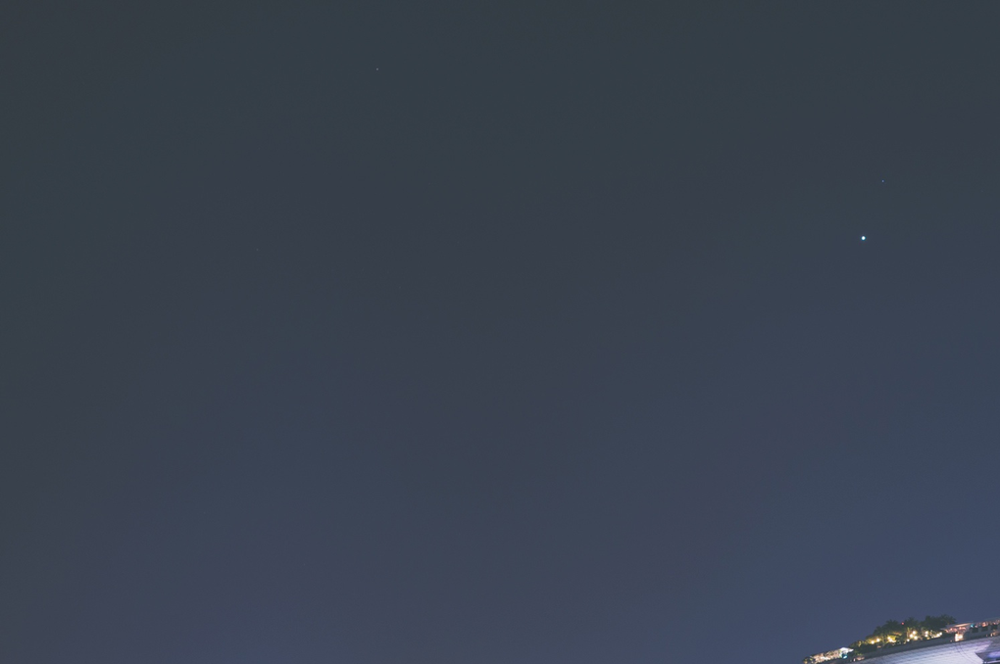

sort by 1105_2000.101010


,image,file,flif,webp,1105_2000.101010
25,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0807_1.png,5.329375,5.444509,5.875376
222,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0856_2.png,5.201057,5.513857,5.792465
24,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0807_0.png,5.288407,5.386437,5.764574
26,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0807_2.png,5.118852,5.240365,5.629274
220,,/scratch_net/fryr/mentzerf/datasets/DIV2K_new/DIV2K_valid_HR_crop4/0856_0.png,4.985532,5.242894,5.408449

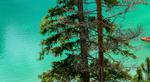
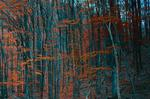
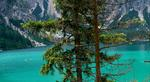
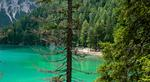
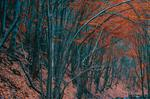

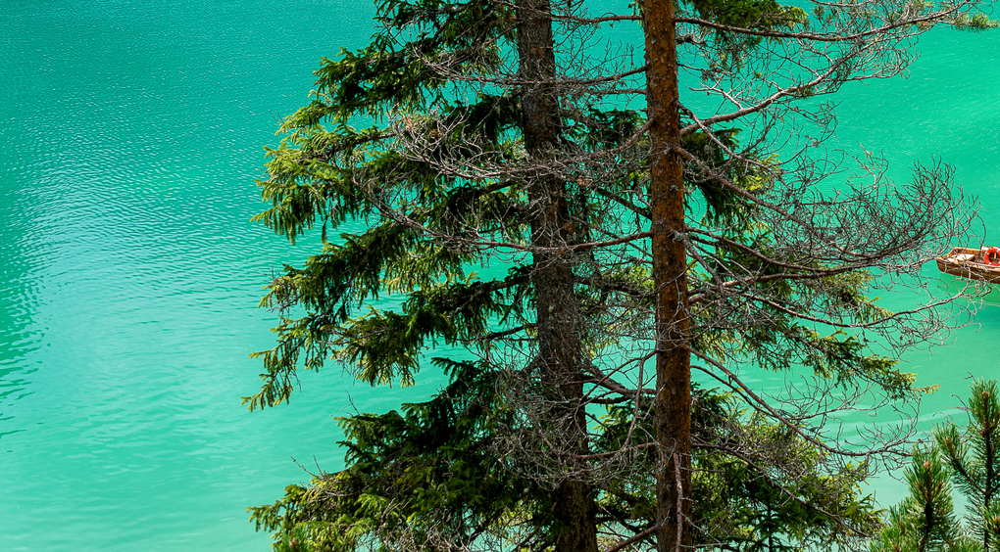

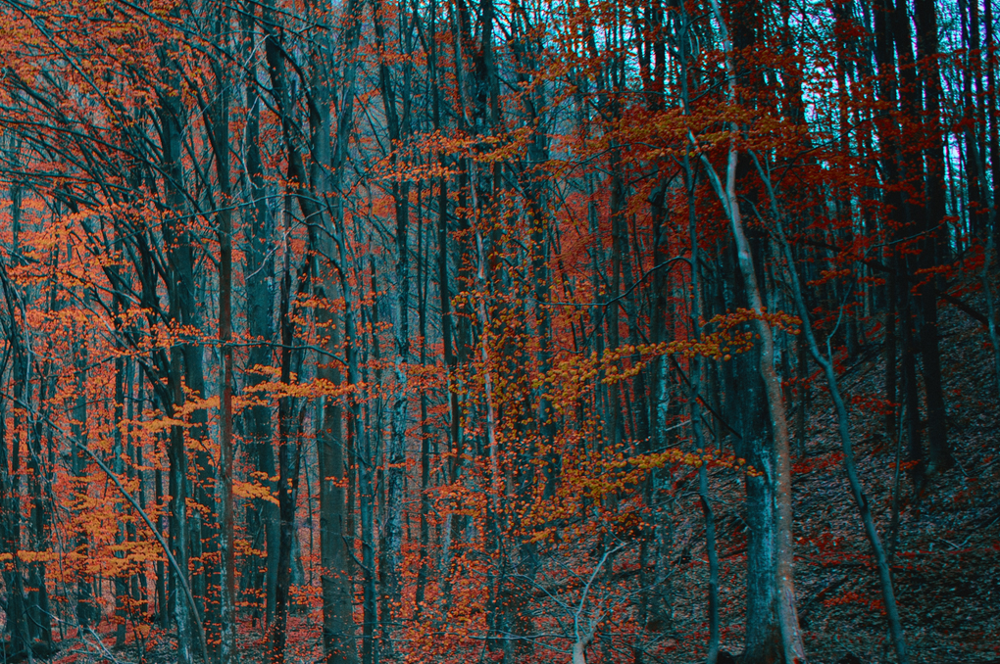

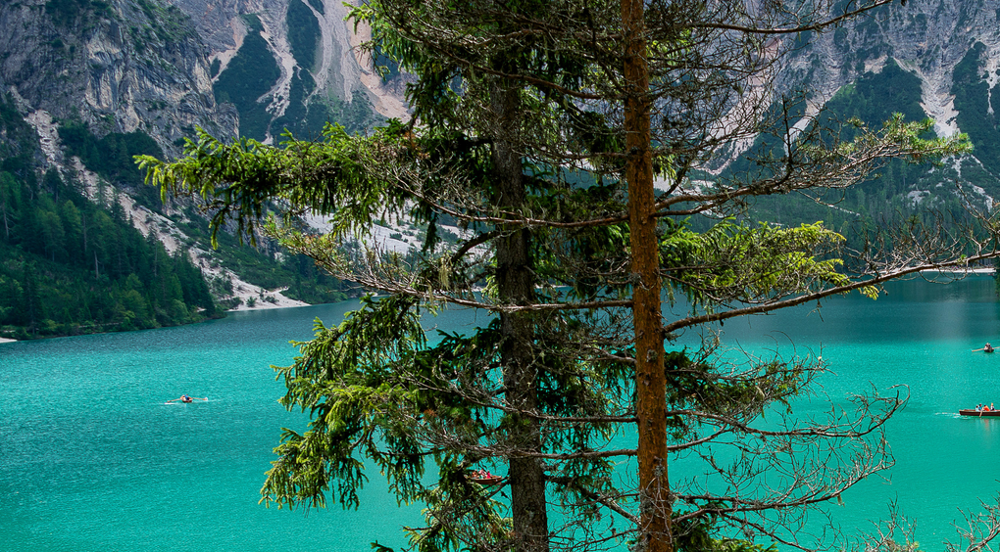

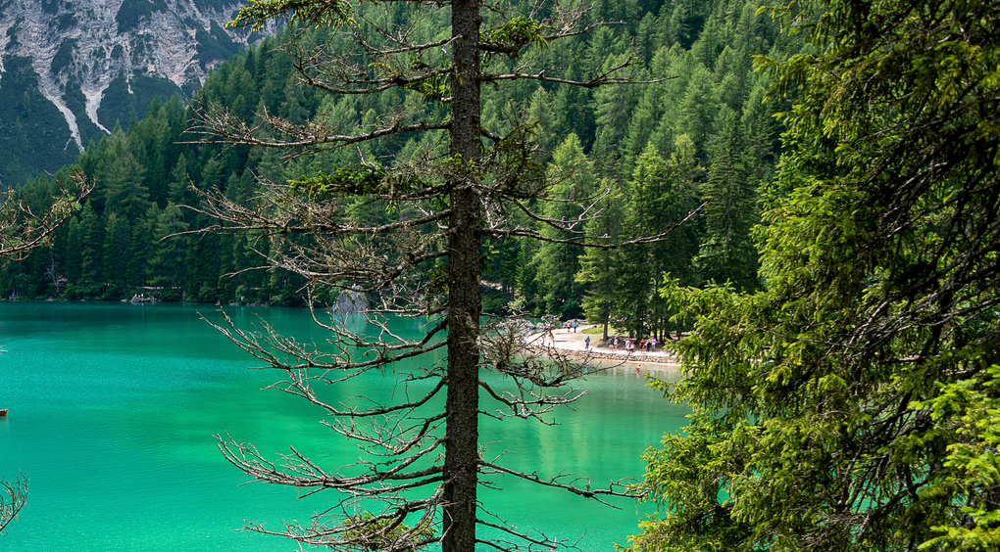

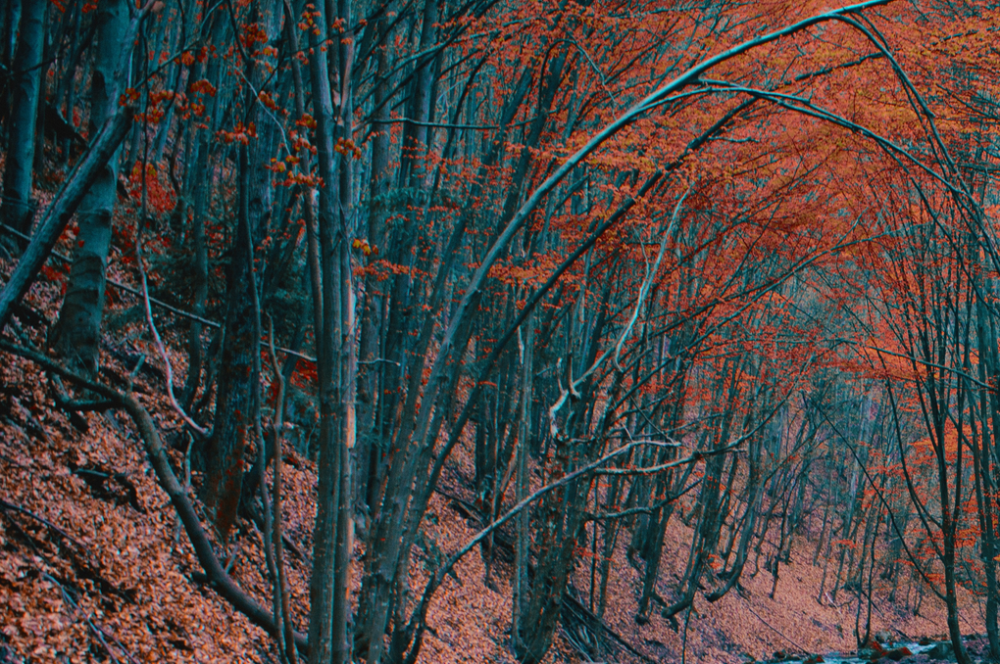

In [13]:
from PIL import Image

for key in ('1105_2000.101010',):
    for ascending in (True, False):
        print('sort by', key)
        val = val.sort_values(key, ascending=ascending)

        display(html(val[['image','file','flif','webp',key]]))
        for p in val['file'].head(5):
            display(Image.open(p))
        

In [ ]:
val = val.sort_values('bpsp', ascending=False)
html(val[display_keys])

In [ ]:
val = val.head()

val['file'] = val.image.map(lambda fn: os.path.join(BASE_DIR, fn))
val['image'] = val.file.map(lambda f: get_thumbnail(f))
val.head()

In [ ]:
val.sort()